In [1]:
import pandas as pd
import pathlib
import rootutils
import torch
import tqdm
import numpy as np
import seaborn as sns

rootutils.setup_root(".", indicator=".project-root", pythonpath=True)
root = pathlib.Path(rootutils.find_root("."))

from torch.nn import functional as F
from matplotlib import pyplot as plt

from src.core.data.sounding_out_chorus import SoundingOutChorus
from src.core.transforms.translation import translation_1d as translation
from src.core.models.sivae import SIVAE
from src.core.models.vae import VAE

def central_finite_difference(x, h=1.0, padding_mode="circular"):
    x = F.pad(x, (1, 1), padding_mode)
    kernel = torch.tensor([[[-1.0, 0.0, 1.0]]], device=x.device, dtype=x.dtype)
    dxdt = F.conv1d(x.unsqueeze(-2), kernel).squeeze(-2)
    return dxdt / (2*h)

def shift_variability(x):
    # x = (n, ld)
    # calculate a spectrogram of each latent dimension across the shifts
    # describes the frequency and magnitude of changes to the feature as the shift is applied
    s = torch.stft(x.transpose(-1, -2), n_fft=32, hop_length=8, return_complex=True).abs().cpu() # (ld, f, t)
    # approximate the derivative w.r.t. the shift and take the absolute value 
    # how much the latent feature magnitude changes at each time-step for each frequency bin
    # describes shift variability at different frequencies
    d = central_finite_difference(s.flatten(end_dim=1), padding_mode="circular").unflatten(0, (s.size(0), s.size(1))).abs()
    # calculate the total magnitude change w-in band across shifts, we don't normalise by the magnitude as otherwise the metric is invariant to mag,
    # we probably should normalise by the bounds of the latent space or the KL of the sample to account for cross-model magnitude variability
    m = d.sum(dim=-1) # (ld, f)
    # the sum is then the total across all bins, examine the average across latent dimensions
    m = m.sum(dim=-1)
    shift_variability_mean = m.mean(dim=0)
    shift_variability_std = m.std(dim=0)
    return shift_variability_mean, shift_variability_std

@torch.no_grad()
def encode(models, data):
    results = []
    with tqdm.notebook.tqdm(total=len(data)) as pbar:
        for i in range(len(data)):
            x = data[i][0].unsqueeze(0)
            x = x.to("cuda")
            x = models[0][1].pre_process(x)
            x = models[0][1].frame(x, window_length=models[0][1].frame_window_length, hop_length=models[0][1].frame_window_length).squeeze(0)
            deltas = torch.linspace(-1, 1, 105, device=x.device)
            # stack shifts along dim 1
            x_trans = torch.stack([
                translation(x.transpose(-1, -2).contiguous(), delta.expand(x.size(0))).transpose(-1, -2).contiguous() 
                for delta in deltas
            ], dim=1)

            for model_name, model in models:
                # for each frame
                for j in range(x_trans.size(0)):
                    # encode all shifts
                    q_z, *_ = model.encode(x_trans[j])
                    mu_z, _ = q_z.squeeze(-2).chunk(2, dim=-1) # (n, ld)
                    dzdT = central_finite_difference(mu_z.transpose(-1, -2), "circular").transpose(-1, -2).abs() # (n, ld)
                    sv_mean, sv_std = shift_variability(mu_z)
                    results.append((i, j, model_name, dzdT.mean().item(), dzdT.std().item(), sv_mean.item(), sv_std.item()))
            pbar.update(1)
    return pd.DataFrame(data=results, columns=["file_i", "frame_i", "model", "dzdt_mean", "dzdt_std", "shift_var_mean", "shift_var_std"])

/its/home/kag25/projects/ecolistening/interpretable_bioacoustic_classifiers/.venv/lib/python3.10/site-packages/lightning/fabric/__init__.py:41: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.


In [2]:
data = SoundingOutChorus("/its/home/kag25/data/sounding_out", test=True)

In [3]:
checkpoint_dir = pathlib.Path("/its/home/kag25/models/")
model_name = "v1/vae/meek-zebra/"
checkpoint_path = "step=180000.ckpt"
vae = VAE.load_from_checkpoint(checkpoint_dir / model_name / checkpoint_path, map_location="cuda").eval()

/its/home/kag25/projects/ecolistening/interpretable_bioacoustic_classifiers/.venv/lib/python3.10/site-packages/lightning/fabric/utilities/cloud_io.py:57: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental

In [6]:
checkpoint_dir = pathlib.Path("/its/home/kag25/models/")
model_name = "v2/sivae/shallow-balsa/"
checkpoint_path = "step=180000.ckpt"
vae_swp = SIVAE.load_from_checkpoint(checkpoint_dir / model_name / checkpoint_path, map_location="cuda").eval()

INFO:src.core.models.sivae:Freezing alignment encoder


In [7]:
checkpoint_dir = pathlib.Path("/its/home/kag25/models/")
model_name = "v3/sivae_soft/wanted-pencil/"
checkpoint_path = "step=180000.ckpt"
vae_avg = SIVAE.load_from_checkpoint(checkpoint_dir / model_name / checkpoint_path, map_location="cuda").eval()

INFO:src.core.models.sivae:Freezing alignment encoder


In [217]:
df = encode([("None", vae), ("Swp", vae_swp), ("Avg", vae_avg)], data)
df

  0%|          | 0/945 [00:00<?, ?it/s]

,file_i,frame_i,model,dzdt_mean,dzdt_std,shift_var_mean,shift_var_std
0,0,0,None,0.177419,0.134146,321.558838,87.005486
1,0,1,None,0.137348,0.105055,284.137787,94.465309
2,0,2,None,0.233086,0.178088,383.126312,113.982330
3,0,3,None,0.255871,0.193952,426.431061,105.271111
4,0,4,None,0.151248,0.113889,235.107773,58.618584
...,...,...,...,...,...,...,...
110560,944,34,Avg,0.005345,0.004080,8.141100,2.384961
110561,944,35,Avg,0.005696,0.004343,7.351725,1.707188
110562,944,36,Avg,0.005695,0.004329,6.954033,1.727285
110563,944,37,Avg,0.005154,0.003947,6.693522,1.480100


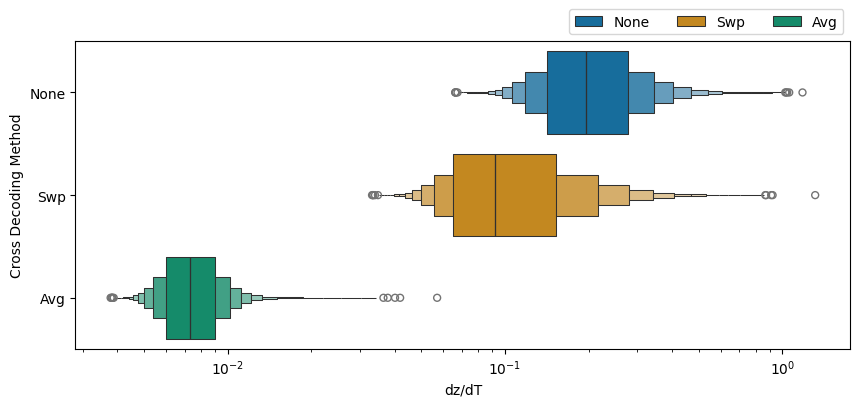

In [372]:
fig, ax = plt.subplots(figsize=(10, 4))
sns.boxenplot(
    data=df,
    x="dzdt_mean", 
    y="model", 
    hue="model",
    hue_order=["None", "Swp", "Avg"],
    palette=sns.color_palette("colorblind", n_colors=3),
    ax=ax, 
    legend=True
)
sns.move_legend(ax, "lower right", bbox_to_anchor=(1, 1), ncol=3, title=None)
ax.set_xlabel("dz/dT")
ax.set_ylabel("Cross Decoding Method")
ax.set_xscale("log")
fig.savefig(root / "dump" / "shift-derivative-population.pdf", format="pdf")
plt.show()

This measure shows the same thing really, but it accounts for different frequencies independently before summation.

Let $Z$ denote a matrix of encoded spectrograms of dimension $J$ stacked column-wise under $N$ translations on $S^1$:

$$
Z[i] = \mathcal{E}(\mathcal{T}(\mathbf{x}, \varphi_i / \pi)), \quad \varphi_i = -\pi + \frac{2\pi i}{N}, \qquad i=0,\ldots,N-1,
$$

Each row in the matrix $Z[j]$ denotes the value of a latent feature under the perturbation of a shift. To assess its stability, we approximate the derivative of each latent variable with respect to the shift:

$$
\nabla_{\varphi}Z_j[i]
\approx
\frac{Z_j[i+1] - Z_j[i-1]}{2\Delta\varphi}
$$

computed using a central finite difference kernel. We can quantify the total variability with respect to the shift by taking the sum over all dimensions:

$$
\sum_j \sum_i \nabla_{\varphi}Z_{i,j}
$$

In addition, we compute a spectrogram $S$ for each $\nabla_{\varphi}Z_j$, and examine the sum of the magnitude of the derivative across each frequency band.


> TODO: figure out how to show this by frequency, we want to be able to show that there is oscillatory behaviour for certain samples, so higher frequencies should be present and have some coverage.

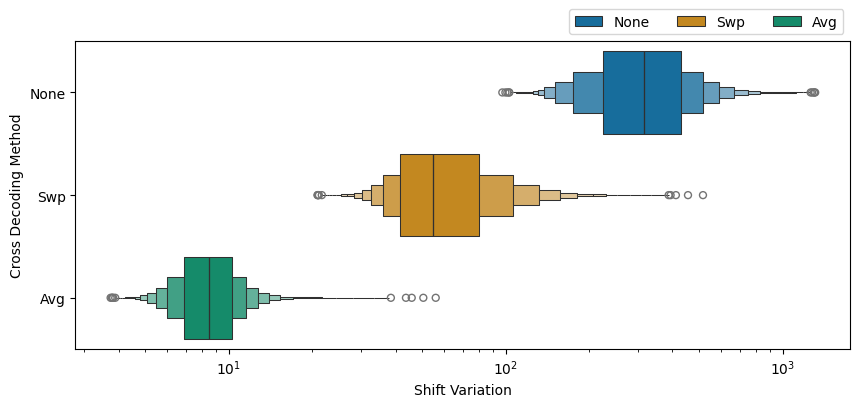

In [373]:
fig, ax = plt.subplots(figsize=(10, 4))
sns.boxenplot(
    data=df,
    x="shift_var_mean", 
    y="model", 
    hue="model",
    hue_order=["None", "Swp", "Avg"],
    palette=sns.color_palette("colorblind", n_colors=3),
    ax=ax, 
    legend=True
)
sns.move_legend(ax, "lower right", bbox_to_anchor=(1, 1), ncol=3, title=None)
ax.set_xlabel("Shift Variation")
ax.set_ylabel("Cross Decoding Method")
ax.set_xscale("log")
fig.savefig(root / "dump" / "shift-variation-population.pdf", format="pdf")
plt.show()

Can we show the variation w.r.t. each frequency bin? A histogram of magnitude changes across shifts within each frequency band, stack as 2D histogram, then sum histograms across the whole dataset, and normalise

In [4]:
duration = 1.536      # seconds
n_samples = 192 # frame size
dt = duration / n_samples
fs = 1 / dt 
n_shifts = 105


print(f"dt = {dt:.6f} s")
print(f"fs = {fs:.3f} Hz")

# Your convention
d_shift_samples = n_samples / n_shifts
d_shift_time = d_shift_samples * dt
fs_shift = 1 / d_shift_time

print(f"\nShift step = {d_shift_samples:.6f} samples")
print(f"Shift step = {d_shift_time:.6f} s")
print(f"Shift-domain sampling rate = {fs_shift:.6f} Hz")

win_length = 32
hop_length = 8

# Frequency ticks for a 32-point FFT
freqs = np.fft.rfftfreq(win_length, d=d_shift_time)

print("\nFrequency ticks (Hz):")
print(freqs)

# Number of STFT frames
n_frames = (n_shifts - win_length) // hop_length + 1
print(f"\nNumber of STFT frames: {n_frames}")

# Time ticks of STFT frames
time_ticks = np.arange(n_frames) * hop_length * d_shift_time

print("\nSTFT time ticks (s):")
print(time_ticks)

dt = 0.008000 s
fs = 125.000 Hz

Shift step = 1.828571 samples
Shift step = 0.014629 s
Shift-domain sampling rate = 68.359375 Hz

Frequency ticks (Hz):
[ 0.          2.13623047  4.27246094  6.40869141  8.54492188 10.68115234
 12.81738281 14.95361328 17.08984375 19.22607422 21.36230469 23.49853516
 25.63476562 27.77099609 29.90722656 32.04345703 34.1796875 ]

Number of STFT frames: 10

STFT time ticks (s):
[0.         0.11702857 0.23405714 0.35108571 0.46811429 0.58514286
 0.70217143 0.8192     0.93622857 1.05325714]


torch.Size([128, 105])


<Axes: xlabel='f_idx', ylabel='latent_dim'>

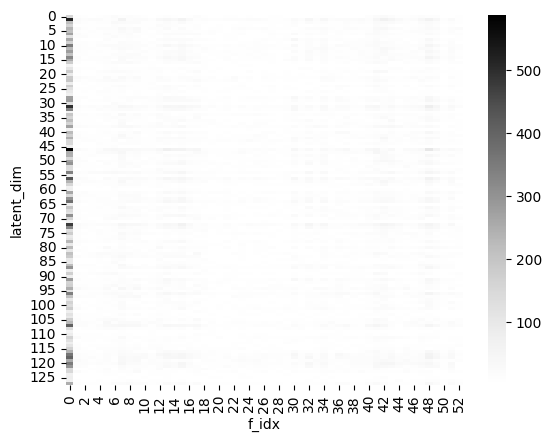

In [82]:
i = 139
j = 9

palette = sns.color_palette("colorblind", n_colors=3)
r = []
model = vae_swp
model_name = "swp"
with torch.no_grad():
    x = data[i][0].unsqueeze(0)
    x = x.to("cuda")
    x = model.pre_process(x)
    x = model.frame(x, window_length=model.frame_window_length, hop_length=model.frame_window_length).squeeze(0)
    x_fr = x[j].view(1, 1, 192, 64)
    N = 105
    h = 2 * torch.pi / N
    deltas = torch.linspace(-1, 1, N, device=x.device)
    x_trans = torch.cat([
        translation(x_fr.transpose(-1, -2).contiguous(), delta).transpose(-1, -2).contiguous() 
        for delta in deltas
    ], dim=0)
    q_z, *_ = model.encode(x_trans)
    mu_z, _ = q_z.squeeze(-2).chunk(2, dim=-1)

    mu_z = mu_z.cpu()
    delta = central_finite_difference(mu_z.transpose(-1, -2), h=h, padding_mode="circular").abs()
    print(delta.size())
    s = torch.stft(delta, n_fft=105, return_complex=True).abs()
    d0, d1, d2 = np.indices(s.shape)
    df = pd.DataFrame({
        "latent_dim": d0.ravel(),
        "f_idx": d1.ravel(),
        "t_idx": d2.ravel(),
        "value": s.ravel(),
    })    
    df["file_i"] = i
    df["model"] = model_name
    # mdf = pd.DataFrame(data=d.sum(dim=-1))
    # mdf["model"] = label
    # r.append(mdf)

    # num_bins = 20
    # bins = np.arange(num_bins)
    # hist, bin_edges = torch.histogram(d.sum(dim=-1), bins=num_bins, range=(bins[0], bins[-1])) 
    # plt.bar(bins + i/3, hist / hist.sum(), width=0.3, color=palette[i], label=label)
# plt.legend()
# plt.show()

# mdf = pd.concat(r, axis=0)
# mdf = mdf.reset_index(names="latent_dim")
# mdf = mdf.melt(id_vars=["model", "latent_dim"], var_name="frequency_bin", value_name="value")
# mdf
# mdf.groupby(["model", "frequency_bin"])["value"]
# sns.histplot(data=mdf, x="value", hue="model", palette=palette, stat="density")
# plt.xticks(range(num_bins + 1), labels=[np.format_float_positional(f, precision=2) for f in np.linspace(freqs[0], freqs[-1], num_bins + 1)], rotation=60)
# plt.xlabel("Frequency (Hz)")
# plt.xlim(left=0, right=20)
# plt.show()
agg = (
    df.groupby(["latent_dim", "f_idx"])["value"]
      .mean()
      .reset_index()
)
agg = (
    df.groupby(["latent_dim", "f_idx"])["value"]
      .mean()
      .reset_index()
)
sns.heatmap(
    agg.pivot(index="latent_dim", columns="f_idx", values="value"),
    cmap="Greys",
)

In [ ]:
i = 138
j = 9

palette = sns.color_palette("colorblind", n_colors=3)
r = []
for i, (model, label) in enumerate(zip([vae, vae_swp, vae_avg], ["None", "Swp", "Avg"])):
    with torch.no_grad():
        x = data[i][0].unsqueeze(0)
        x = x.to("cuda")
        x = model.pre_process(x)
        x = model.frame(x, window_length=model.frame_window_length, hop_length=model.frame_window_length).squeeze(0)
        x_fr = x[j].view(1, 1, 192, 64)
        deltas = torch.linspace(-1, 1, 105, device=x.device)
        x_trans = torch.cat([
            translation(x_fr.transpose(-1, -2).contiguous(), delta).transpose(-1, -2).contiguous() 
            for delta in deltas
        ], dim=0)
        q_z, *_ = model.encode(x_trans)
        mu_z, _ = q_z.squeeze(-2).chunk(2, dim=-1)
    
        mu_z = mu_z.cpu()
        s = torch.stft(mu_z.transpose(-1, -2), n_fft=32, hop_length=8, return_complex=True).abs()
        d = central_finite_difference(s.flatten(end_dim=1), padding_mode="circular").unflatten(0, (s.size(0), s.size(1))).abs()
        
        mdf = pd.DataFrame(data=d.sum(dim=-1))
        mdf["model"] = label
        r.append(mdf)

        num_bins = 20
        bins = np.arange(num_bins)
        hist, bin_edges = torch.histogram(d.sum(dim=-1), bins=num_bins, range=(bins[0], bins[-1])) 
        plt.bar(bins + i/3, hist / hist.sum(), width=0.3, color=palette[i], label=label)
plt.legend()
plt.show()

mdf = pd.concat(r, axis=0)
mdf = mdf.reset_index(names="latent_dim")
mdf = mdf.melt(id_vars=["model", "latent_dim"], var_name="frequency_bin", value_name="value")
mdf
# mdf.groupby(["model", "frequency_bin"])["value"]
# sns.histplot(data=mdf, x="value", hue="model", palette=palette, stat="density")
# plt.xticks(range(num_bins + 1), labels=[np.format_float_positional(f, precision=2) for f in np.linspace(freqs[0], freqs[-1], num_bins + 1)], rotation=60)
# plt.xlabel("Frequency (Hz)")
# plt.xlim(left=0, right=20)
# plt.show()

In [256]:
def shift_variability(x):
    # x = (n, ld)
    # calculate a spectrogram of each latent dimension across the shiftsSW
    # describes the frequency and magnitude of changes to the feature as the shift is applied
    s = torch.stft(x.transpose(-1, -2), n_fft=32, hop_length=8, return_complex=True).abs().cpu()
    # approximate the derivative w.r.t. the shift and take the absolute value 
    # how much the latent feature magnitude changes at each time-step for eSach frequency bin
    # describes shift variability at different frequencies
    d = central_finite_difference(s.flatten(end_dim=1), padding_mode="circular").unflatten(0, (s.size(0), s.size(1))).abs()
    # calculate the total shift variability
    # normalise by the spectrogram magnitude re-weighs each bin to approximately equal contribution
    # high frequencies and low frequencies are equally weighted in the metric
    # changes in magnitude of the feature are treated as equal across frequencies
    m = d.sum(dim=-1) / s.sum(dim=-1)
    # the sum is then the total across all bins, examine the average across latent dimensions
    m = m.sum(dim=-1)
    shift_variability_mean = m.mean(dim=0)
    shift_variability_std = m.std(dim=0)
    return shift_variability_mean, shift_variability_std

In [ ]:
# failure cases & why?
sivae_df = df[(df["Model"] == "SIVAE") & (df["Metric"] == "Sample Mean")]
top_4_min = sivae_df.sort_values(by="dz/dT", ascending=True).iloc[:4]
top_4_min

In [167]:
top_4_max = sivae_df.sort_values(by="dz/dT", ascending=False).iloc[:4]
top_4_max

,file_i,frame_i,Model,Metric,dz/dT
55420,476,1,SIVAE,Sample Mean,1.784849
70109,852,26,SIVAE,Sample Mean,0.933749
72035,902,2,SIVAE,Sample Mean,0.865548
37350,12,27,SIVAE,Sample Mean,0.830705


In [96]:
sorted_df = sivae_df.sort_values(by="dz/dT")
median_4 = pd.concat([
    sorted_df[sorted_df["dz/dT"] <= sorted_df["dz/dT"].median()].iloc[-2:],
    sorted_df[sorted_df["dz/dT"] >= sorted_df["dz/dT"].median()].iloc[:2],
], axis=0)
median_4

,file_i,frame_i,Model,Metric,dz/dT
44528,196,29,SIVAE,Sample Mean,0.093658
39842,76,23,SIVAE,Sample Mean,0.093665
39842,76,23,SIVAE,Sample Mean,0.093665
48537,299,21,SIVAE,Sample Mean,0.093668


In [95]:
sorted_df = sivae_df.sort_values(by="dz/dT")
mean_4 = pd.concat([
    sorted_df[sorted_df["dz/dT"] <= sorted_df["dz/dT"].mean()].iloc[-2:],
    sorted_df[sorted_df["dz/dT"] >= sorted_df["dz/dT"].mean()].iloc[:2],
], axis=0)
mean_4

,file_i,frame_i,Model,Metric,dz/dT
72499,913,37,SIVAE,Sample Mean,0.126682
63049,671,25,SIVAE,Sample Mean,0.126701
59464,579,28,SIVAE,Sample Mean,0.126708
54585,454,24,SIVAE,Sample Mean,0.126712


,file_i,frame_i,Model,Metric,dz/dT
44794,203,22,SIVAE,Sample Mean,0.032350
42246,138,9,SIVAE,Sample Mean,0.034686
47105,262,32,SIVAE,Sample Mean,0.034904
47111,262,38,SIVAE,Sample Mean,0.035121


file_i             203
frame_i             22
Model            SIVAE
Metric     Sample Mean
dz/dT          0.03235
Name: 44794, dtype: object
file_i             138
frame_i              9
Model            SIVAE
Metric     Sample Mean
dz/dT         0.034686
Name: 42246, dtype: object
file_i             262
frame_i             32
Model            SIVAE
Metric     Sample Mean
dz/dT         0.034904
Name: 47105, dtype: object
file_i             262
frame_i             38
Model            SIVAE
Metric     Sample Mean
dz/dT         0.035121
Name: 47111, dtype: object


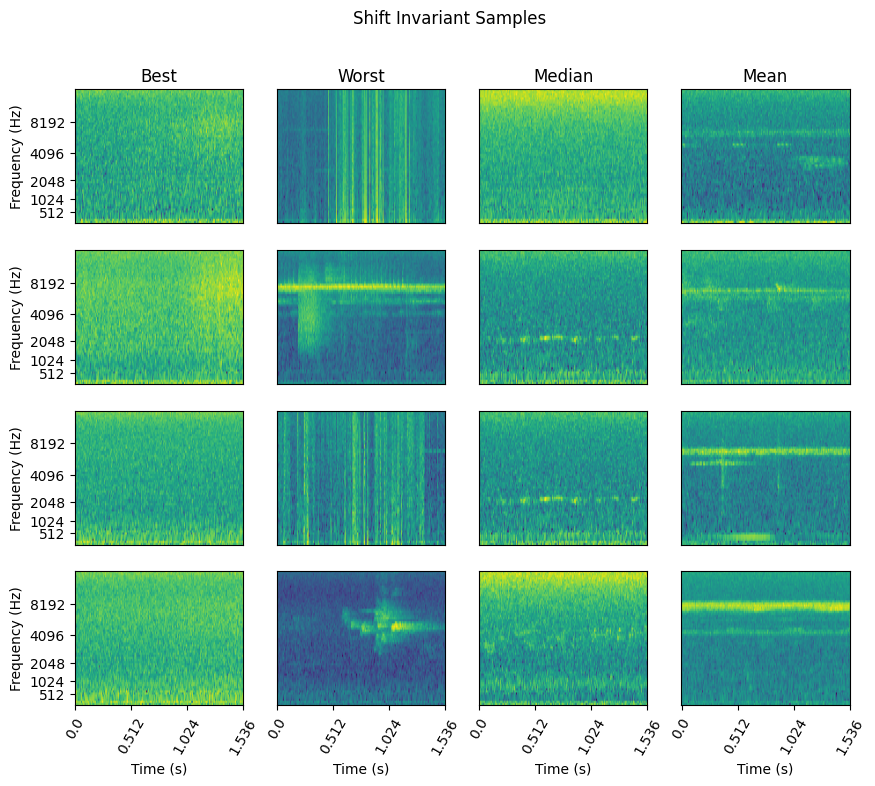

In [169]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 8))

for i, (_, row) in enumerate(top_4_min.iterrows()):
    ax = axes[i, 0]
    x = data[row.file_i][0].unsqueeze(0)
    x = x.to("cuda")
    x = model.pre_process(x)
    x = model.frame(x, window_length=model.frame_window_length, hop_length=model.frame_window_length).squeeze()
    x_fr = x[row.frame_i].cpu().numpy()
    model.front_end.plot(x_fr.T, ax=ax)
    if i == 0:
        ax.set_title("Best")
    if i != 3:
        ax.tick_params(labelbottom=False, bottom=False)
        ax.set_xlabel("")
    else:
        ax.set_xticks(np.linspace(0, 192, 4, dtype=int), labels=np.linspace(0, 1.536, 4), rotation=60)


for i, (_, row) in enumerate(top_4_max.iterrows()):
    ax = axes[i, 1]
    x = data[row.file_i][0].unsqueeze(0)
    x = x.to("cuda")
    x = model.pre_process(x)
    x = model.frame(x, window_length=model.frame_window_length, hop_length=model.frame_window_length).squeeze()
    x_fr = x[row.frame_i].cpu().numpy()
    model.front_end.plot(x_fr.T, ax=ax)
    ax.set_ylabel("")
    ax.tick_params(labelleft=False, left=False)
    if i == 0:
        ax.set_title("Worst")
    if i != 3:
        ax.tick_params(labelbottom=False, bottom=False)
        ax.set_xlabel("")
    else:
        ax.set_xticks(np.linspace(0, 192, 4, dtype=int), labels=np.linspace(0, 1.536, 4), rotation=60)
        ax.set_title("")

for i, (_, row) in enumerate(median_4.iterrows()):
    ax = axes[i, 2]
    x = data[row.file_i][0].unsqueeze(0)
    x = x.to("cuda")
    x = model.pre_process(x)
    x = model.frame(x, window_length=model.frame_window_length, hop_length=model.frame_window_length).squeeze()
    x_fr = x[row.frame_i].cpu().numpy()
    model.front_end.plot(x_fr.T, ax=ax)
    ax.set_ylabel("")
    ax.tick_params(labelleft=False, left=False)
    if i == 0:
        ax.set_title("Median")
    if i != 3:
        ax.tick_params(labelbottom=False, bottom=False)
        ax.set_xlabel("")
    else:
        ax.set_xticks(np.linspace(0, 192, 4, dtype=int), labels=np.linspace(0, 1.536, 4), rotation=60)
        ax.set_title("")

for i, (_, row) in enumerate(mean_4.iterrows()):
    ax = axes[i, 3]
    x = data[row.file_i][0].unsqueeze(0)
    x = x.to("cuda")
    x = model.pre_process(x)
    x = model.frame(x, window_length=model.frame_window_length, hop_length=model.frame_window_length).squeeze()
    x_fr = x[row.frame_i].cpu().numpy()
    model.front_end.plot(x_fr.T, ax=ax)
    ax.set_ylabel("")
    ax.tick_params(labelleft=False, left=False)
    if i == 0:
        ax.set_title("Mean")
    if i != 3:
        ax.tick_params(labelbottom=False, bottom=False)
        ax.set_xlabel("")
    else:
        ax.set_xticks(np.linspace(0, 192, 4, dtype=int), labels=np.linspace(0, 1.536, 4), rotation=60)
        ax.set_title("")

fig.suptitle("Shift Invariant Samples")
plt.show()

file_i             476
frame_i              1
Model            SIVAE
Metric     Sample Mean
dz/dT         1.784849
Name: 55420, dtype: object
file_i             852
frame_i             26
Model            SIVAE
Metric     Sample Mean
dz/dT         0.933749
Name: 70109, dtype: object
file_i             902
frame_i              2
Model            SIVAE
Metric     Sample Mean
dz/dT         0.865548
Name: 72035, dtype: object
file_i              12
frame_i             27
Model            SIVAE
Metric     Sample Mean
dz/dT         0.830705
Name: 37350, dtype: object


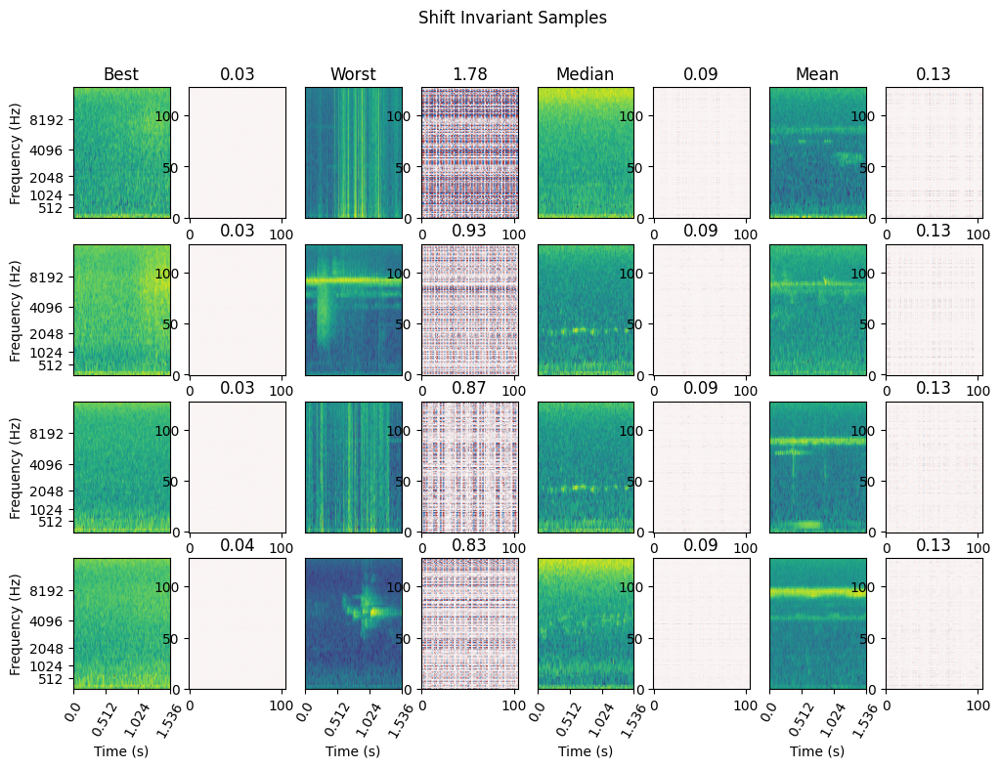

In [231]:
fig, axes = plt.subplots(nrows=4, ncols=8, figsize=(12, 8))

im_params = dict(
    vmin=-3, vmax=3,
    origin="lower",
    aspect="auto",
    cmap=sns.color_palette("vlag", as_cmap=True)
)

with torch.no_grad():
    for i, (_, row) in enumerate(top_4_min.iterrows()):
        ax1, ax2 = axes[i, 0:2]
        x = data[row.file_i][0].unsqueeze(0)
        x = x.to("cuda")
        x = model.pre_process(x)
        x = model.frame(x, window_length=model.frame_window_length, hop_length=model.frame_window_length).squeeze(0)
        x_fr = x[row.frame_i].view(1, 1, 192, 64)
        model.front_end.plot(x_fr.squeeze().cpu().t(), ax=ax1)
        if i == 0:
            ax1.set_title("Best")
        if i != 3:
            ax1.tick_params(labelbottom=False, bottom=False)
            ax1.set_xlabel("")
        else:
            ax1.set_xticks(np.linspace(0, 192, 4, dtype=int), labels=np.linspace(0, 1.536, 4), rotation=60)
        deltas = torch.linspace(-1, 1, 105, device=x.device)
        x_trans = torch.cat([
            translation(x_fr.transpose(-1, -2).contiguous(), delta).transpose(-1, -2).contiguous() 
            for delta in deltas
        ], dim=0)
        q_z, *_ = model.encode(x_trans)
        mu_z, _ = q_z.squeeze(-2).chunk(2, dim=-1)
        dzdT = central_finite_difference(mu_z.transpose(-1, -2), "circular").cpu()
        mean = dzdT.abs().mean()
        im = ax2.imshow(dzdT, **im_params)
        ax2.set_title(np.format_float_positional(mean.numpy(), precision=2))
    
    for i, (_, row) in enumerate(top_4_max.iterrows()):
        print(row)
        ax1, ax2 = axes[i, 2:4]
        x = data[row.file_i][0].unsqueeze(0)
        x = x.to("cuda")
        x = model.pre_process(x)
        x = model.frame(x, window_length=model.frame_window_length, hop_length=model.frame_window_length).squeeze(0)
        x_fr = x[row.frame_i].view(1, 1, 192, 64)
        model.front_end.plot(x_fr.squeeze().cpu().t(), ax=ax1)
        ax1.set_ylabel("")
        ax1.tick_params(labelleft=False, left=False)
        if i == 0:
            ax1.set_title("Worst")
        if i != 3:
            ax1.tick_params(labelbottom=False, bottom=False)
            ax1.set_xlabel("")
        else:
            ax1.set_xticks(np.linspace(0, 192, 4, dtype=int), labels=np.linspace(0, 1.536, 4), rotation=60)
            ax1.set_title("")
        deltas = torch.linspace(-1, 1, 105, device=x.device)
        x_trans = torch.cat([
            translation(x_fr.transpose(-1, -2).contiguous(), delta).transpose(-1, -2).contiguous() 
            for delta in deltas
        ], dim=0)
        q_z, *_ = model.encode(x_trans)
        mu_z, _ = q_z.squeeze(-2).chunk(2, dim=-1)
        dzdT = central_finite_difference(mu_z.transpose(-1, -2), "circular").cpu()
        mean = dzdT.abs().mean()
        im = ax2.imshow(dzdT, **im_params)
        ax2.set_title(np.format_float_positional(mean.numpy(), precision=2))

    for i, (_, row) in enumerate(median_4.iterrows()):
        ax1, ax2 = axes[i, 4:6]
        x = data[row.file_i][0].unsqueeze(0)
        x = x.to("cuda")
        x = model.pre_process(x)
        x = model.frame(x, window_length=model.frame_window_length, hop_length=model.frame_window_length).squeeze(0)
        x_fr = x[row.frame_i].view(1, 1, 192, 64)
        model.front_end.plot(x_fr.squeeze().cpu().t(), ax=ax1)
        ax1.set_ylabel("")
        ax1.tick_params(labelleft=False, left=False)
        if i == 0:
            ax1.set_title("Median")
        if i != 3:
            ax1.tick_params(labelbottom=False, bottom=False)
            ax1.set_xlabel("")
        else:
            ax1.set_xticks(np.linspace(0, 192, 4, dtype=int), labels=np.linspace(0, 1.536, 4), rotation=60)
            ax1.set_title("")
        deltas = torch.linspace(-1, 1, 105, device=x.device)
        x_trans = torch.cat([
            translation(x_fr.transpose(-1, -2).contiguous(), delta).transpose(-1, -2).contiguous() 
            for delta in deltas
        ], dim=0)
        q_z, *_ = model.encode(x_trans)
        mu_z, _ = q_z.squeeze(-2).chunk(2, dim=-1)
        dzdT = central_finite_difference(mu_z.transpose(-1, -2), "circular").cpu()
        mean = dzdT.abs().mean()
        im = ax2.imshow(dzdT, **im_params)
        ax2.set_title(np.format_float_positional(mean.numpy(), precision=2))

    for i, (_, row) in enumerate(mean_4.iterrows()):
        ax1, ax2 = axes[i, 6:8]
        x = data[row.file_i][0].unsqueeze(0)
        x = x.to("cuda")
        x = model.pre_process(x)
        x = model.frame(x, window_length=model.frame_window_length, hop_length=model.frame_window_length).squeeze(0)
        x_fr = x[row.frame_i].view(1, 1, 192, 64)
        model.front_end.plot(x_fr.squeeze().cpu().t(), ax=ax1)
        ax1.set_ylabel("")
        ax1.tick_params(labelleft=False, left=False)
        if i == 0:
            ax1.set_title("Mean")
        if i != 3:
            ax1.tick_params(labelbottom=False, bottom=False)
            ax1.set_xlabel("")
        else:
            ax1.set_xticks(np.linspace(0, 192, 4, dtype=int), labels=np.linspace(0, 1.536, 4), rotation=60)
            ax1.set_title("")
        deltas = torch.linspace(-1, 1, 105, device=x.device)
        x_trans = torch.cat([
            translation(x_fr.transpose(-1, -2).contiguous(), delta).transpose(-1, -2).contiguous() 
            for delta in deltas
        ], dim=0)
        q_z, *_ = model.encode(x_trans)
        mu_z, _ = q_z.squeeze(-2).chunk(2, dim=-1)
        dzdT = central_finite_difference(mu_z.transpose(-1, -2), "circular").cpu()
        mean = dzdT.abs().mean()
        im = ax2.imshow(dzdT, **im_params)
        ax2.set_title(np.format_float_positional(mean.numpy(), precision=2))

fig.suptitle("Shift Invariant Samples")
plt.show()

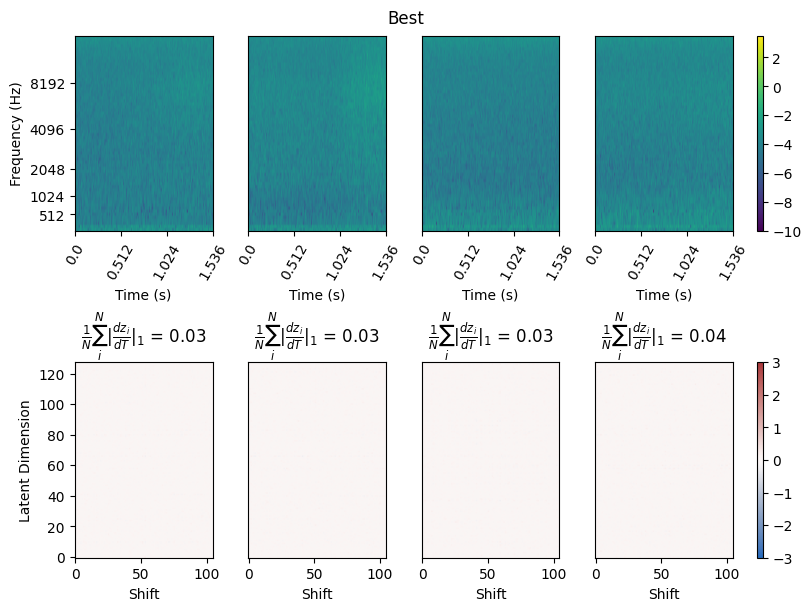

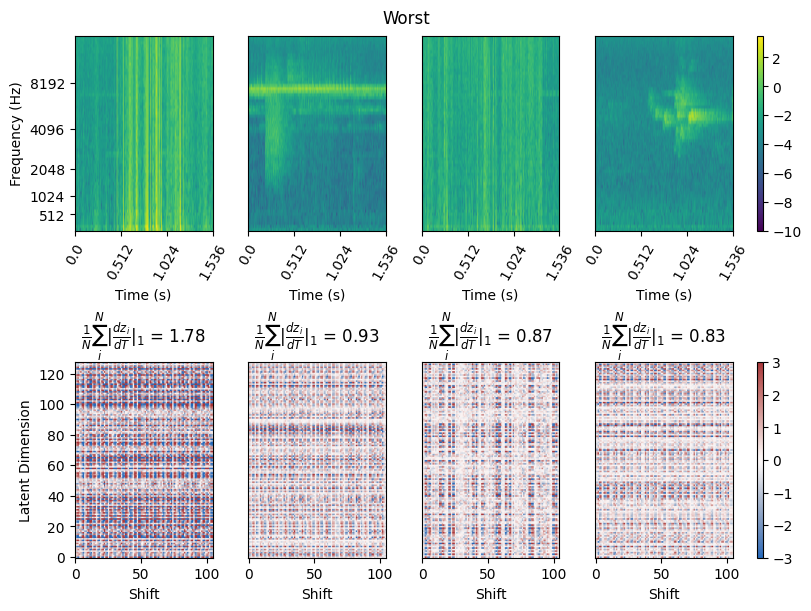

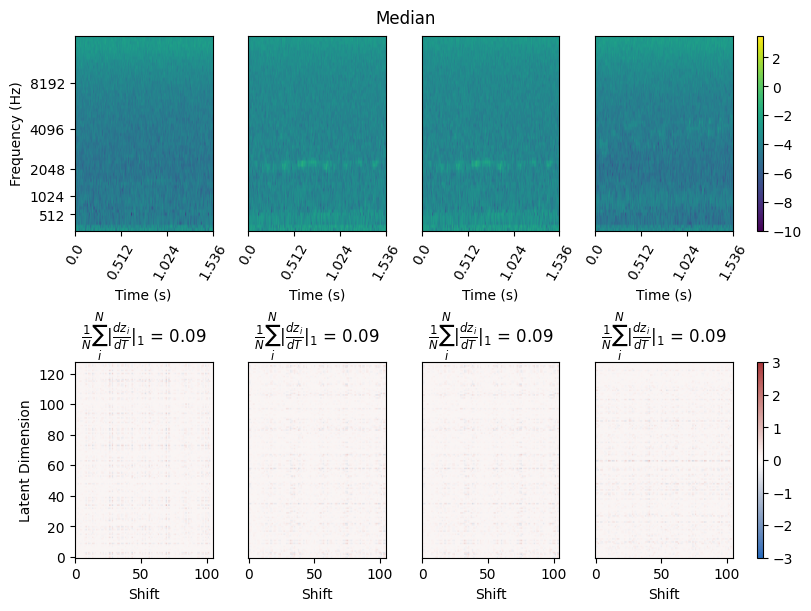

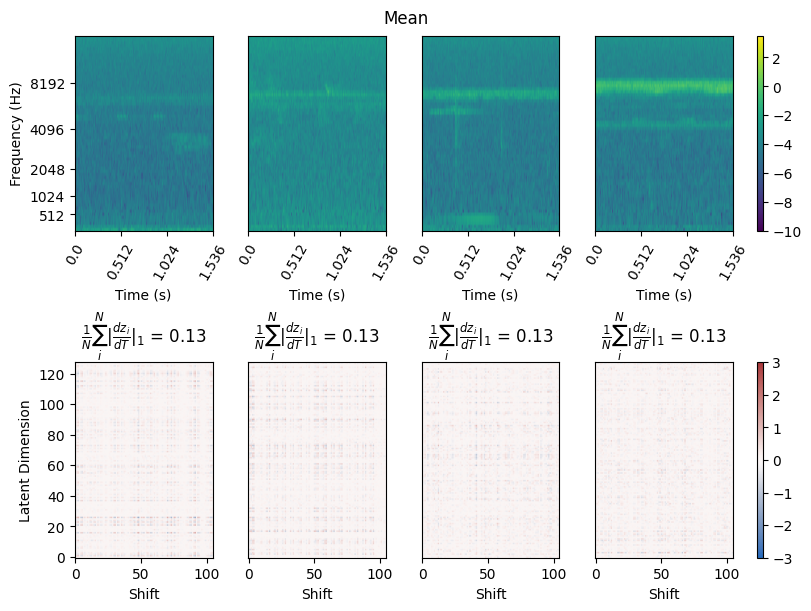

In [250]:
im_params = dict(
    vmin=-3, vmax=3,
    origin="lower",
    aspect="auto",
    cmap=sns.color_palette("vlag", as_cmap=True)
)

spec_params = dict(
    vmin=-10,
    vmax=3.5,
)

with torch.no_grad():
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(8, 6), constrained_layout=True, width_ratios=[0.25, 0.25, 0.25, 0.25, 0.01])
    for i, (_, row) in enumerate(top_4_min.iterrows()):
        ax1, ax2 = axes[:, i]
        x = data[row.file_i][0].unsqueeze(0)
        x = x.to("cuda")
        x = model.pre_process(x)
        x = model.frame(x, window_length=model.frame_window_length, hop_length=model.frame_window_length).squeeze(0)
        x_fr = x[row.frame_i].view(1, 1, 192, 64)
        mesh = model.front_end.plot(x_fr.squeeze().cpu().t(), **spec_params, ax=ax1)
        ax1.set_xticks(np.linspace(0, 192, 4, dtype=int), labels=np.linspace(0, 1.536, 4), rotation=60)
        if i != 0:
            ax1.set_ylabel("")
            ax1.tick_params(labelleft=False, left=False)
        deltas = torch.linspace(-1, 1, 105, device=x.device)
        x_trans = torch.cat([
            translation(x_fr.transpose(-1, -2).contiguous(), delta).transpose(-1, -2).contiguous() 
            for delta in deltas
        ], dim=0)
        q_z, *_ = model.encode(x_trans)
        mu_z, _ = q_z.squeeze(-2).chunk(2, dim=-1)
        dzdT = central_finite_difference(mu_z.transpose(-1, -2), "circular").cpu()
        mean = dzdT.abs().mean()
        im = ax2.imshow(dzdT, **im_params)
        ax2.set_xlabel("Shift")
        if i == 0:
            ax2.set_ylabel("Latent Dimension")
        else:
            ax2.set_ylabel("")
            ax2.tick_params(labelleft=False, left=False)
        title = rf"$\frac{{1}}{{N}}\sum_i^N|\frac{{dz_i}}{{dT}}|_1$ = {np.format_float_positional(mean.numpy(), precision=2)}"
        ax2.set_title(title)
    fig.colorbar(mesh, cax=axes[0, -1])
    fig.colorbar(im, cax=axes[1, -1])
    fig.suptitle("Best")
    plt.show()

    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(8, 6), constrained_layout=True, width_ratios=[0.25, 0.25, 0.25, 0.25, 0.01])
    for i, (_, row) in enumerate(top_4_max.iterrows()):
        ax1, ax2 = axes[:, i]
        x = data[row.file_i][0].unsqueeze(0)
        x = x.to("cuda")
        x = model.pre_process(x)
        x = model.frame(x, window_length=model.frame_window_length, hop_length=model.frame_window_length).squeeze(0)
        x_fr = x[row.frame_i].view(1, 1, 192, 64)
        mesh = model.front_end.plot(x_fr.squeeze().cpu().t(), **spec_params, ax=ax1)
        ax1.set_xticks(np.linspace(0, 192, 4, dtype=int), labels=np.linspace(0, 1.536, 4), rotation=60)
        if i != 0:
            ax1.set_ylabel("")
            ax1.tick_params(labelleft=False, left=False)
        deltas = torch.linspace(-1, 1, 105, device=x.device)
        x_trans = torch.cat([
            translation(x_fr.transpose(-1, -2).contiguous(), delta).transpose(-1, -2).contiguous() 
            for delta in deltas
        ], dim=0)
        q_z, *_ = model.encode(x_trans)
        mu_z, _ = q_z.squeeze(-2).chunk(2, dim=-1)
        dzdT = central_finite_difference(mu_z.transpose(-1, -2), "circular").cpu()
        mean = dzdT.abs().mean()
        im = ax2.imshow(dzdT, **im_params)
        ax2.set_xlabel("Shift")
        if i == 0:
            ax2.set_ylabel("Latent Dimension")
        else:
            ax2.set_ylabel("")
            ax2.tick_params(labelleft=False, left=False)
        title = rf"$\frac{{1}}{{N}}\sum_i^N|\frac{{dz_i}}{{dT}}|_1$ = {np.format_float_positional(mean.numpy(), precision=2)}"
        ax2.set_title(title)
    fig.colorbar(mesh, cax=axes[0, -1])
    fig.colorbar(im, cax=axes[1, -1])
    fig.suptitle("Worst")
    plt.show()

    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(8, 6), constrained_layout=True, width_ratios=[0.25, 0.25, 0.25, 0.25, 0.01])
    for i, (_, row) in enumerate(median_4.iterrows()):
        ax1, ax2 = axes[:, i]
        x = data[row.file_i][0].unsqueeze(0)
        x = x.to("cuda")
        x = model.pre_process(x)
        x = model.frame(x, window_length=model.frame_window_length, hop_length=model.frame_window_length).squeeze(0)
        x_fr = x[row.frame_i].view(1, 1, 192, 64)
        mesh = model.front_end.plot(x_fr.squeeze().cpu().t(), **spec_params, ax=ax1)
        ax1.set_xticks(np.linspace(0, 192, 4, dtype=int), labels=np.linspace(0, 1.536, 4), rotation=60)
        if i != 0:
            ax1.set_ylabel("")
            ax1.tick_params(labelleft=False, left=False)
        deltas = torch.linspace(-1, 1, 105, device=x.device)
        x_trans = torch.cat([
            translation(x_fr.transpose(-1, -2).contiguous(), delta).transpose(-1, -2).contiguous() 
            for delta in deltas
        ], dim=0)
        q_z, *_ = model.encode(x_trans)
        mu_z, _ = q_z.squeeze(-2).chunk(2, dim=-1)
        dzdT = central_finite_difference(mu_z.transpose(-1, -2), "circular").cpu()
        mean = dzdT.abs().mean()
        im = ax2.imshow(dzdT, **im_params)
        ax2.set_xlabel("Shift")
        if i == 0:
            ax2.set_ylabel("Latent Dimension")
        else:
            ax2.set_ylabel("")
            ax2.tick_params(labelleft=False, left=False)
        title = rf"$\frac{{1}}{{N}}\sum_i^N|\frac{{dz_i}}{{dT}}|_1$ = {np.format_float_positional(mean.numpy(), precision=2)}"
        ax2.set_title(title)
    fig.colorbar(mesh, cax=axes[0, -1])
    fig.colorbar(im, cax=axes[1, -1])
    fig.suptitle("Median")
    plt.show()

    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(8, 6), constrained_layout=True, width_ratios=[0.25, 0.25, 0.25, 0.25, 0.01])
    for i, (_, row) in enumerate(mean_4.iterrows()):
        ax1, ax2 = axes[:, i]
        x = data[row.file_i][0].unsqueeze(0)
        x = x.to("cuda")
        x = model.pre_process(x)
        x = model.frame(x, window_length=model.frame_window_length, hop_length=model.frame_window_length).squeeze(0)
        x_fr = x[row.frame_i].view(1, 1, 192, 64)
        mesh = model.front_end.plot(x_fr.squeeze().cpu().t(), **spec_params, ax=ax1)
        ax1.set_xticks(np.linspace(0, 192, 4, dtype=int), labels=np.linspace(0, 1.536, 4), rotation=60)
        if i != 0:
            ax1.set_ylabel("")
            ax1.tick_params(labelleft=False, left=False)
        deltas = torch.linspace(-1, 1, 105, device=x.device)
        x_trans = torch.cat([
            translation(x_fr.transpose(-1, -2).contiguous(), delta).transpose(-1, -2).contiguous() 
            for delta in deltas
        ], dim=0)
        q_z, *_ = model.encode(x_trans)
        mu_z, _ = q_z.squeeze(-2).chunk(2, dim=-1)
        dzdT = central_finite_difference(mu_z.transpose(-1, -2), "circular").cpu()
        mean = dzdT.abs().mean()
        im = ax2.imshow(dzdT, **im_params)
        ax2.set_xlabel("Shift")
        if i == 0:
            ax2.set_ylabel("Latent Dimension")
        else:
            ax2.set_ylabel("")
            ax2.tick_params(labelleft=False, left=False)
        title = rf"$\frac{{1}}{{N}}\sum_i^N|\frac{{dz_i}}{{dT}}|_1$ = {np.format_float_positional(mean.numpy(), precision=2)}"
        ax2.set_title(title)
    fig.colorbar(mesh, cax=axes[0, -1])
    fig.colorbar(im, cax=axes[1, -1])
    fig.suptitle("Mean")
    plt.show()

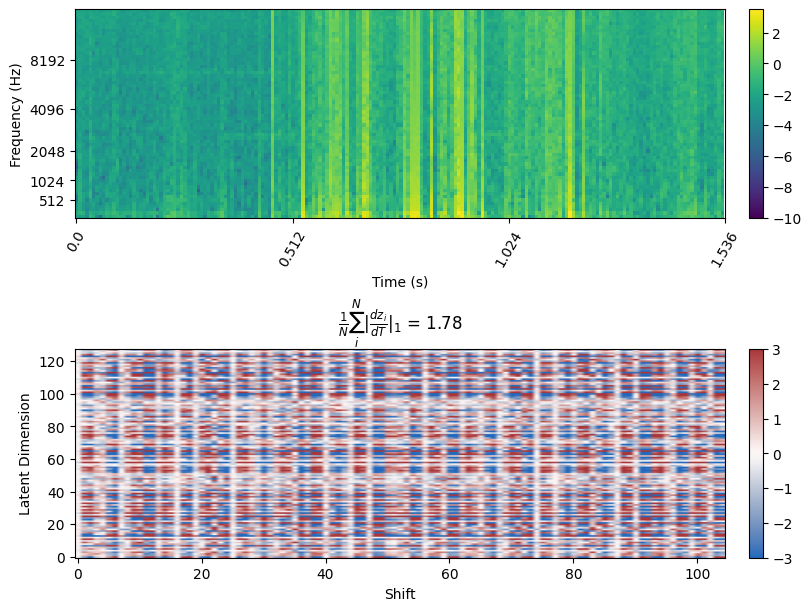

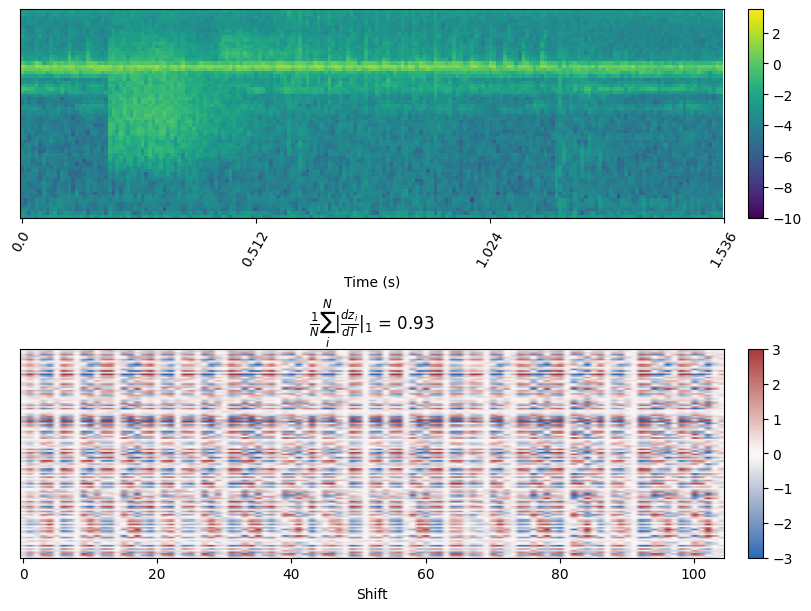

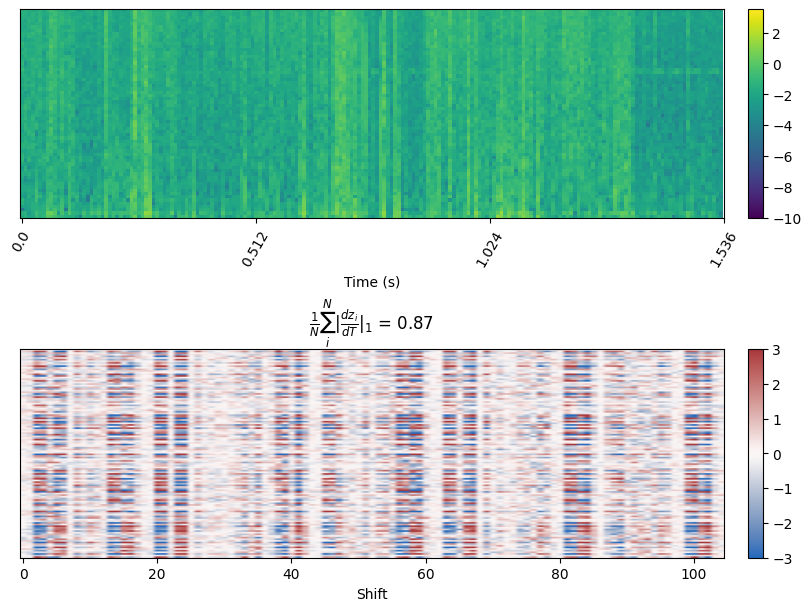

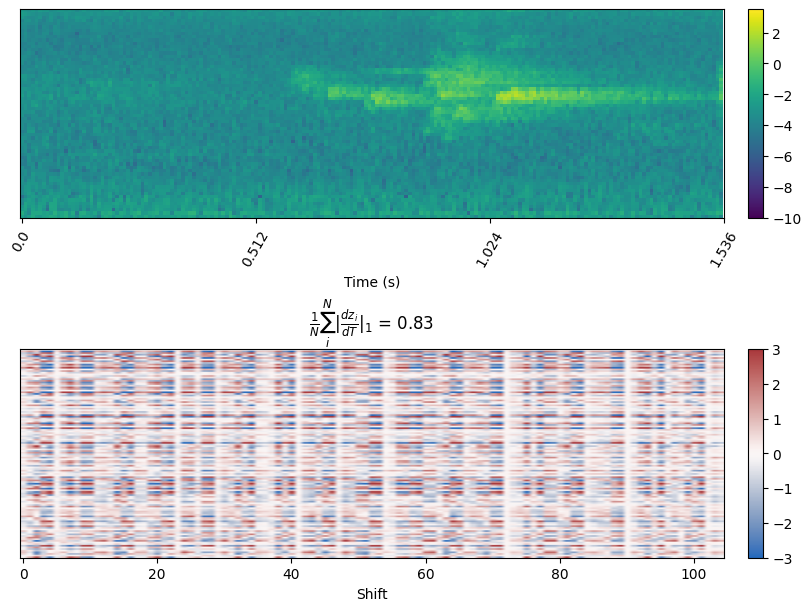

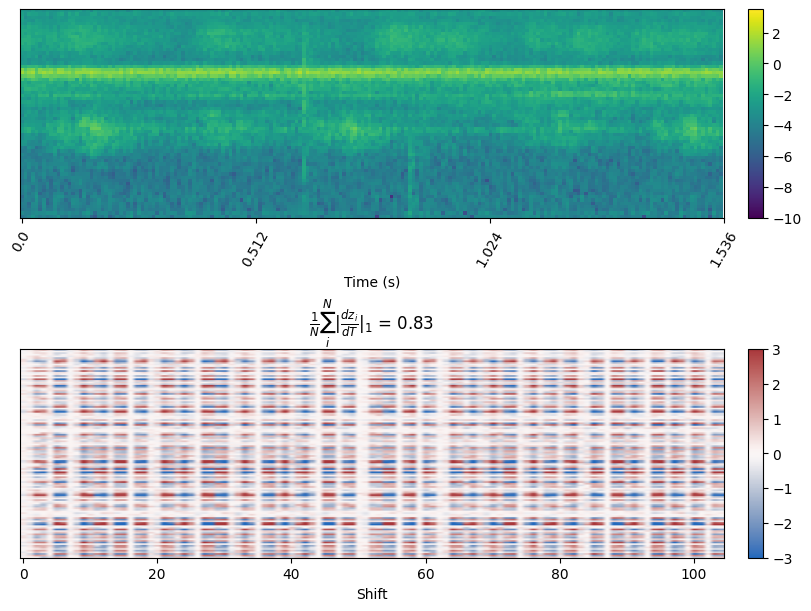

...

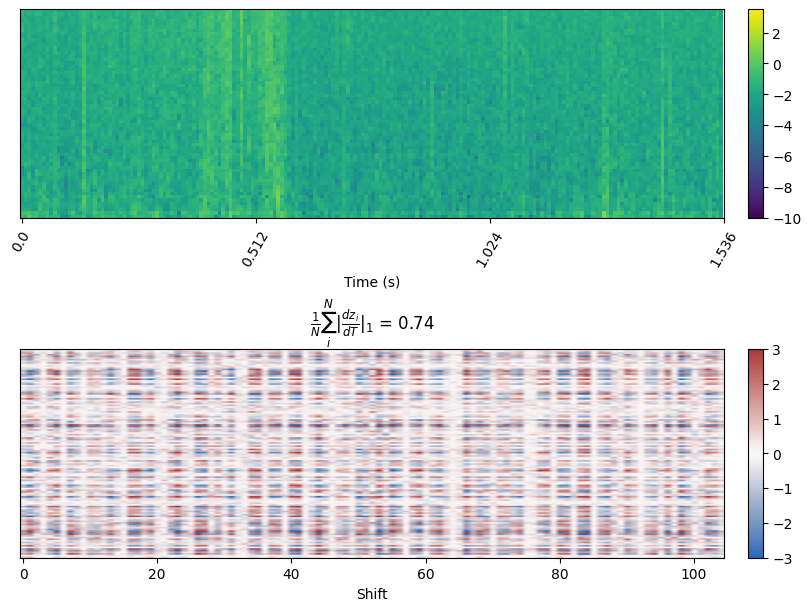

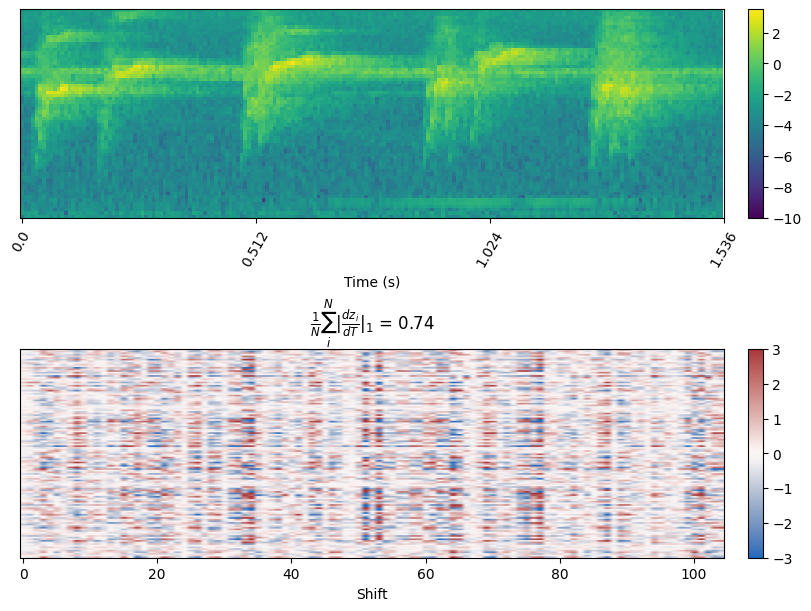

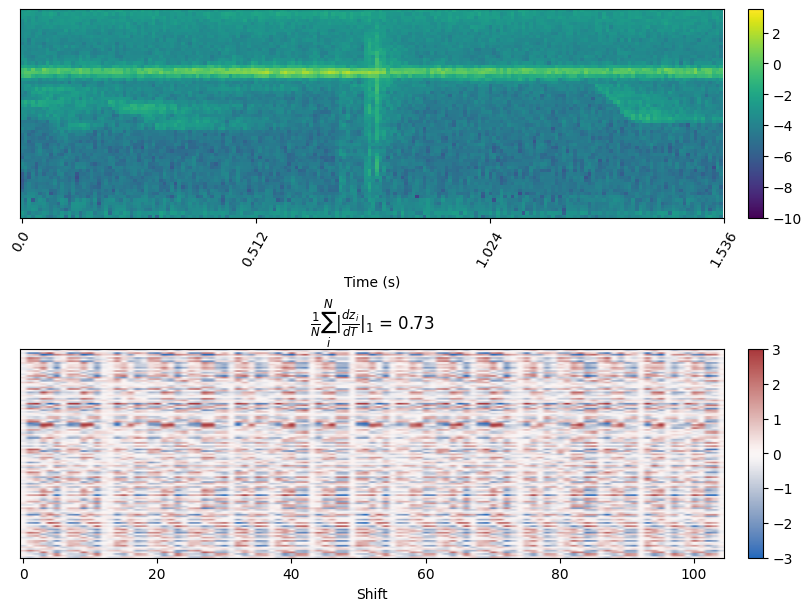

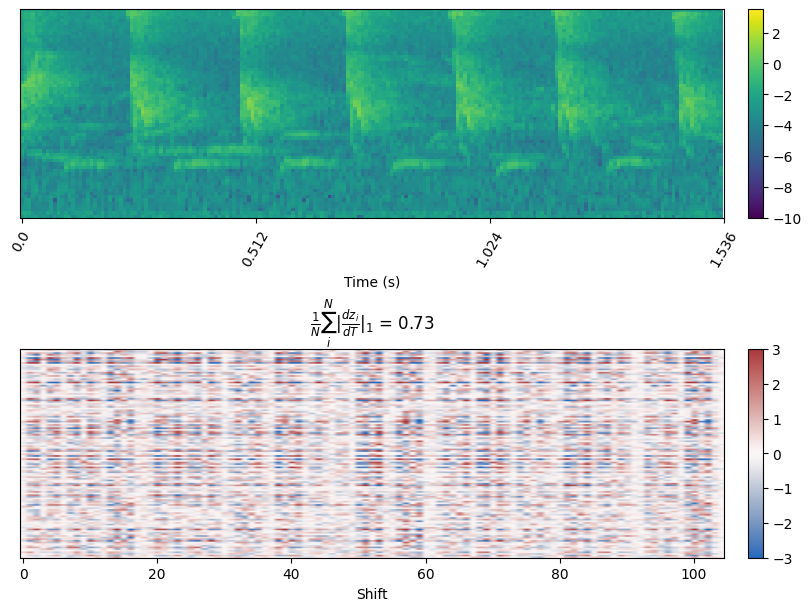

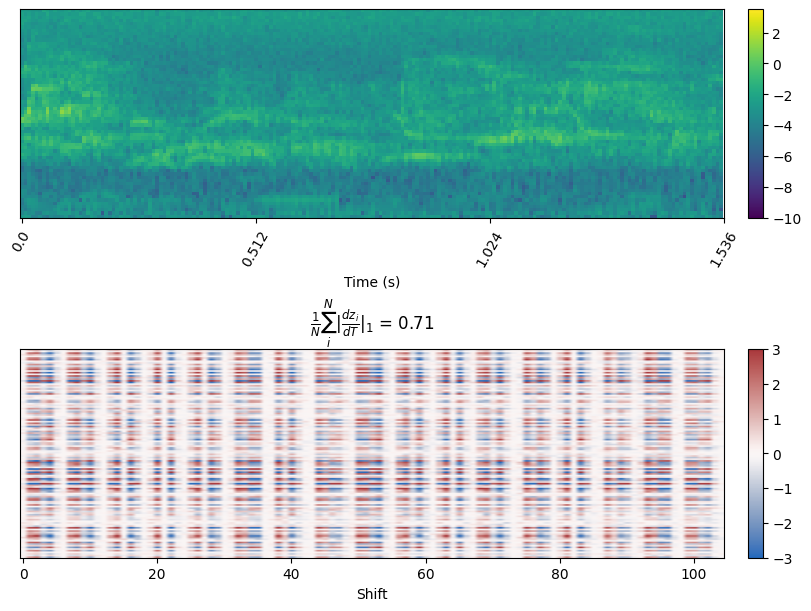

In [256]:
n = 24
worst_n = sivae_df.sort_values(by="dz/dT", ascending=False).iloc[:n]

with torch.no_grad():
    for i, (_, row) in enumerate(worst_n.iterrows()):
        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 6), constrained_layout=True, width_ratios=[0.98, 0.02])
        ax1, ax2 = axes[:, 0]
        x = data[row.file_i][0].unsqueeze(0)
        x = x.to("cuda")
        x = model.pre_process(x)
        x = model.frame(x, window_length=model.frame_window_length, hop_length=model.frame_window_length).squeeze(0)
        x_fr = x[row.frame_i].view(1, 1, 192, 64)
        mesh = model.front_end.plot(x_fr.squeeze().cpu().t(), **spec_params, ax=ax1)
        ax1.set_xticks(np.linspace(0, 192, 4, dtype=int), labels=np.linspace(0, 1.536, 4), rotation=60)
        if i != 0:
            ax1.set_ylabel("")
            ax1.tick_params(labelleft=False, left=False)
        deltas = torch.linspace(-1, 1, 105, device=x.device)
        x_trans = torch.cat([
            translation(x_fr.transpose(-1, -2).contiguous(), delta).transpose(-1, -2).contiguous() 
            for delta in deltas
        ], dim=0)
        q_z, *_ = model.encode(x_trans)
        mu_z, _ = q_z.squeeze(-2).chunk(2, dim=-1)
        dzdT = central_finite_difference(mu_z.transpose(-1, -2), "circular").cpu()
        mean = dzdT.abs().mean()
        im = ax2.imshow(dzdT, **im_params)
        ax2.set_xlabel("Shift")
        if i == 0:
            ax2.set_ylabel("Latent Dimension")
        else:
            ax2.set_ylabel("")
            ax2.tick_params(labelleft=False, left=False)
        title = rf"$\frac{{1}}{{N}}\sum_i^N|\frac{{dz_i}}{{dT}}|_1$ = {np.format_float_positional(mean.numpy(), precision=2)}"
        ax2.set_title(title)
        fig.colorbar(mesh, cax=axes[0, -1])
        fig.colorbar(im, cax=axes[1, -1])
        plt.show()